<div style="display:block;width:100%;margin:auto;" direction=rtl align=center><br><br>
    <div  style="width:100%;margin:100;display:block;background-color:#fff0;"  display=block align=center>
        <table style="border-style:hidden;border-collapse:collapse;">             <tr>
                <td  style="border: none!important;">
                    <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#045F5F"> <b>Armin Ghasemi</b><br><br>810100198</i></font></h1>
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#045F5F"> <b> computer vision </b><br><br>HW_1</i></font></h1>
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#045F5F"> <b>  </b><br><br></i></font></h1>
                </td>
                <td style="border: none!important;">
                    <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />
                </td>
           </tr>
        </table>
    </div>
</div>


# Part 1: Image Processing Fundamentals

## 1. Understanding Basic Color Spaces

We often work with three primary image formats:

* **RGB (Red, Green, Blue):** This is the most common format for digital color images. Each pixel is represented by a combination of three "channels": Red, Green, and Blue. The mix of these three intensity values creates all the colors we see.
* **Grayscale:** This is a "black and white" image. Each pixel has only one value representing its intensity or brightness, typically ranging from 0 (pure black) to 255 (pure white).
* **Binary:** This is the simplest format. Each pixel is either pure black (0) or pure white (255), with no shades of gray.

**Conversion:** We use `cv2.cvtColor()` to switch between spaces. For instance, `cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)` converts a color image to Grayscale. To get a Binary image, we apply a "threshold" to the Grayscale image (e.g., all pixels below 127 become 0, all above become 255).

## 2. The HSV Color Space (A Deeper Look)

**HSV (Hue, Saturation, Value)** is a more intuitive way to represent color that aligns with how humans perceive it. We convert to it using `cv2.cvtColor(image, cv2.COLOR_BGR2HSV)`.

This model is extremely useful in computer vision because it separates the color information (Hue) from the brightness (Value). This allows us to make changes to an image's brightness without affecting its colors, which is difficult in RGB.

* **H (Hue):** This channel represents the pure color itself (e.g., 'red', 'green', 'blue'). It is mapped on a 360-degree circle (though in OpenCV, it's often scaled to 0-179).
* **S (Saturation):** This channel represents the "purity" or "vividness" of the color. A low saturation value means the color is washed out and looks more gray. A high saturation value is a very rich, pure color.
* **V (Value):** This channel represents the brightness of the color. A low value is dark (closer to black), and a high value is bright (closer to the pure color).

## 3. Image Histograms and Contrast

An **Image Histogram** is a simple bar graph. It shows the distribution of pixel intensities in an image.

* The **x-axis** represents the brightness level (from 0/black to 255/white).
* The **y-axis** shows the number of pixels in the image that have that specific brightness level.

A dark image will have most of its bars clustered on the left side of the histogram. A bright image will have them on the right. An image with low contrast will have all its bars clustered in a narrow band.

### Histogram Equalization
This is a powerful technique to automatically improve global contrast. It works by "spreading out" the most frequent pixel intensity values across the *entire* 0-255 range. If an image looks washed out, equalization can reveal hidden details by making the darks darker and the brights brighter.

### Histogram Stretching
This is a simpler method, also known as "contrast stretching" or "normalization." It finds the darkest pixel value (min) and the brightest pixel value (max) in the image. Then, it "stretches" this range to fill the full 0-255 spectrum. For example, if the darkest pixel is 50 and the brightest is 200, it remaps 50 to 0, 200 to 255, and scales all other values in between.

--- Step 0: Setting up paths ---
Input path: assets/Pic.jpg
Output directory is ready: outputs/part1

--- Step 1: Loading Image and Displaying Info ---
Image Dimensions (Height, Width, Channels): (600, 800, 3)
Data Type: uint8
Number of Color Channels: 3


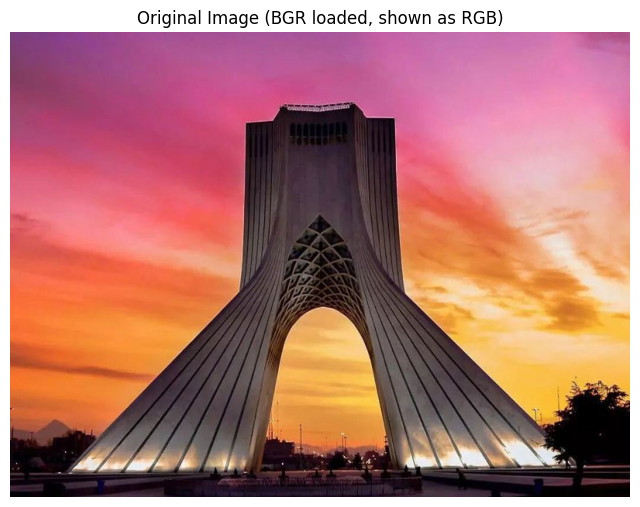


--- Step 2: Converting Color Spaces ---
Showing and saving RGB (Original) image...


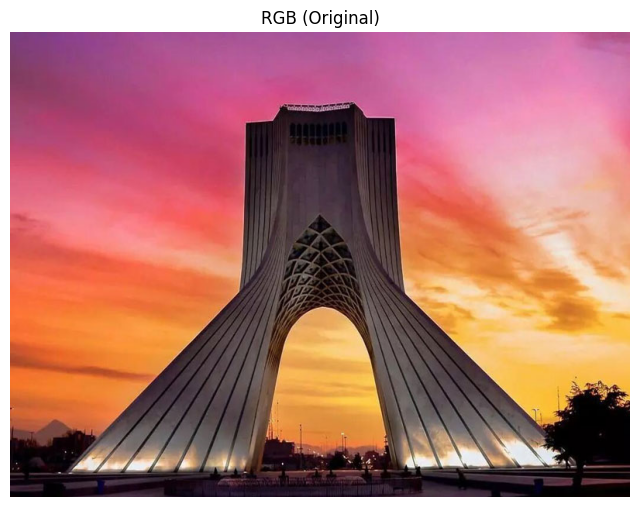

Image successfully saved to:
outputs/part1/rgb_image.jpg

Converting to Grayscale...


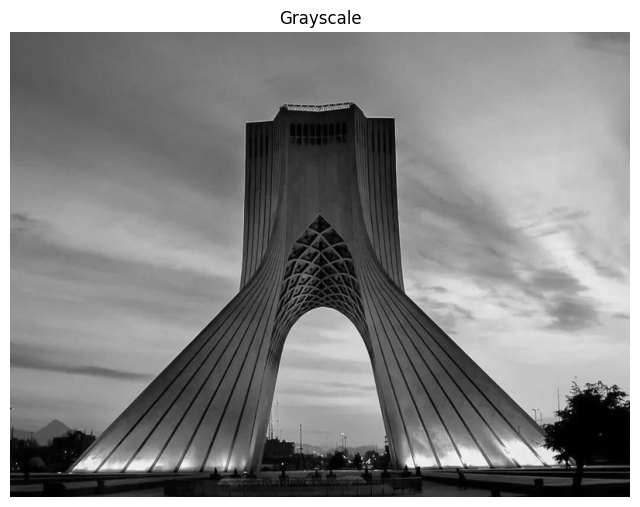

Image successfully saved to:
outputs/part1/grayscale_image.jpg

Converting to Binary (Otsu's Thresholding)...
Calculated Binary Threshold (Otsu): 106.0


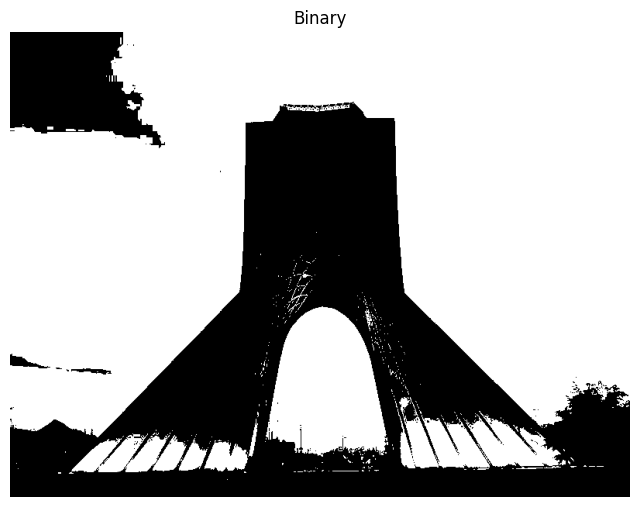

Image successfully saved to:
outputs/part1/binary_image.jpg

Converting to HSV...
Showing HSV image...


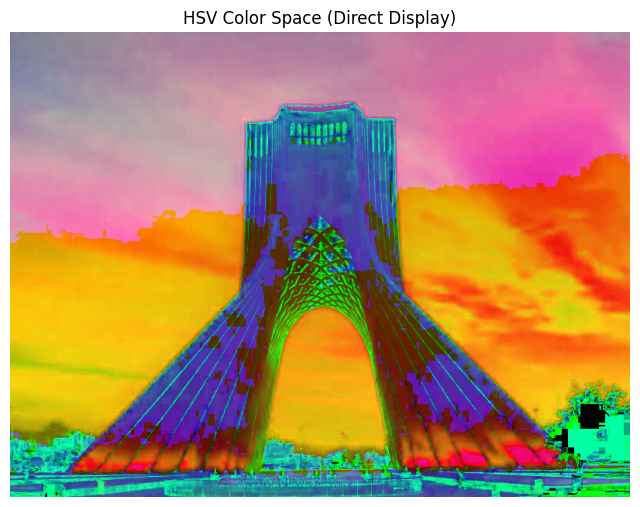

Image successfully saved to:
outputs/part1/hsv_image.jpg


--- Step 3: Splitting Color Channels ---
Splitting BGR channels (shown as grayscale intensity maps)...


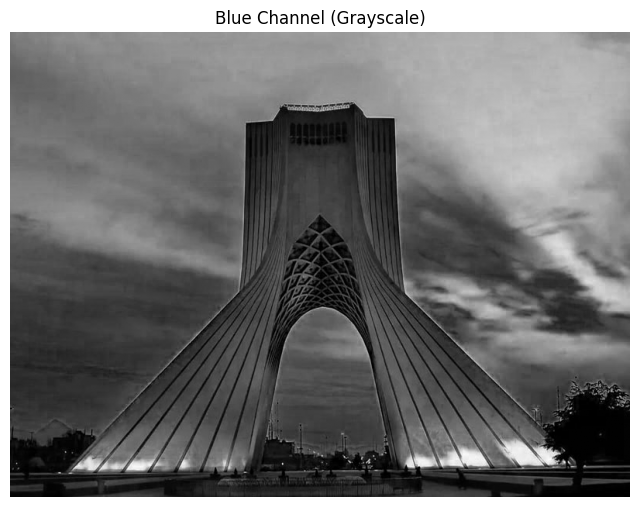

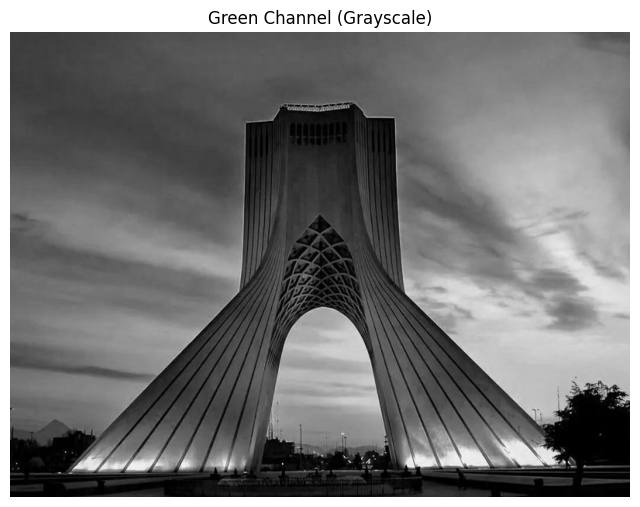

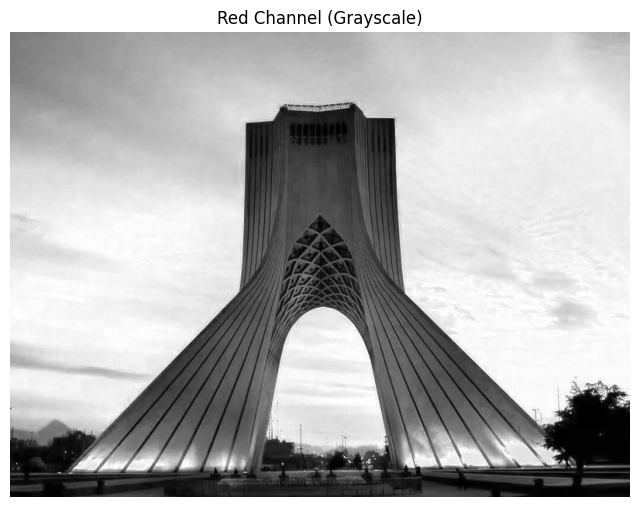

Splitting HSV components (shown as grayscale)...


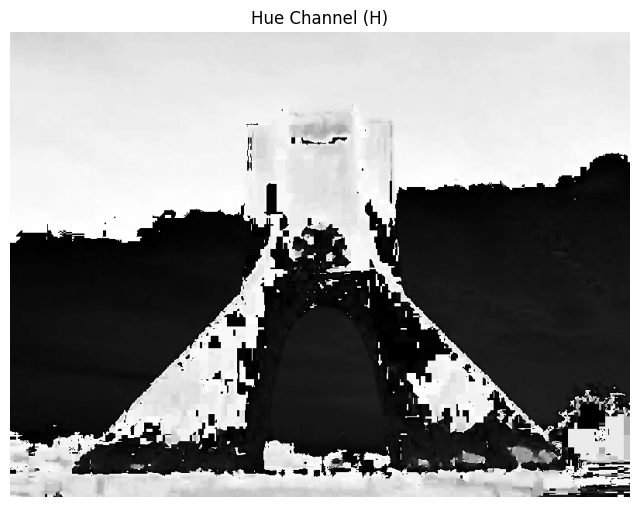

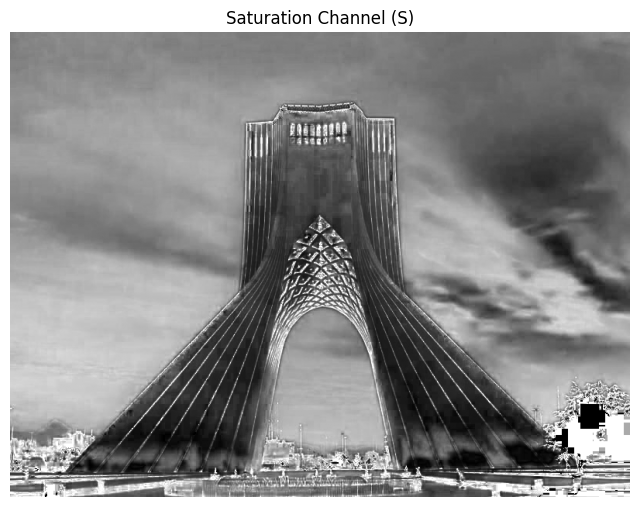

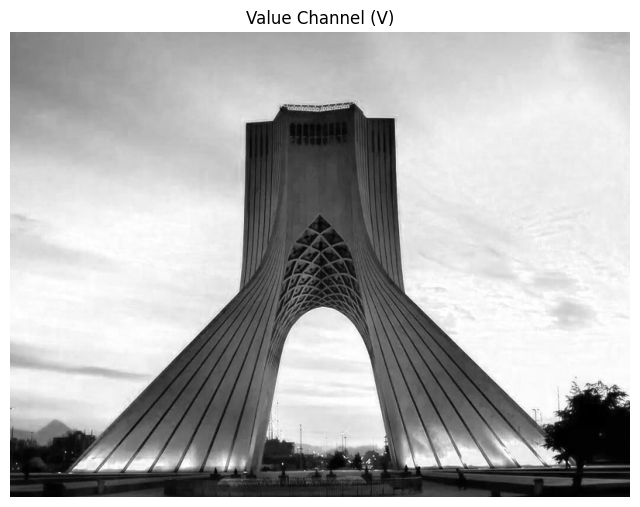


--- Step 4: Contrast Manipulation (on BGR Image) ---
Original Contrast (Std. Deviation of Grayscale): 58.56
Showing and saving High Contrast image...


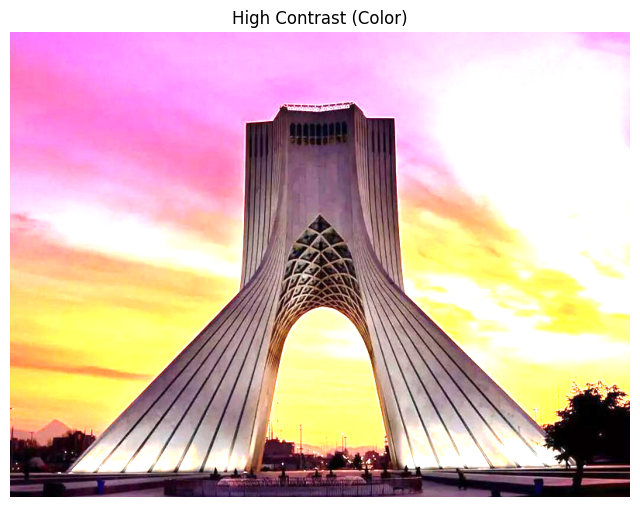

Image successfully saved to:
outputs/part1/high_contrast_color.jpg

Showing and saving Low Contrast image...


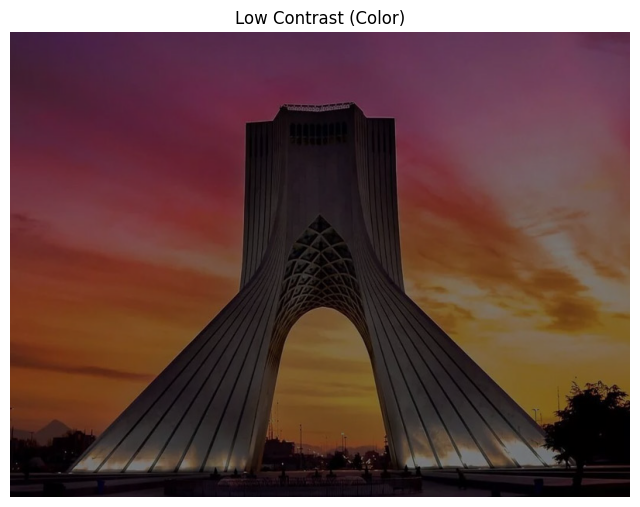

Image successfully saved to:
outputs/part1/low_contrast_color.jpg


--- Step 5: Histogram Correction (on Color Image via V-Channel) ---
Plotting and saving the original V-channel histogram...


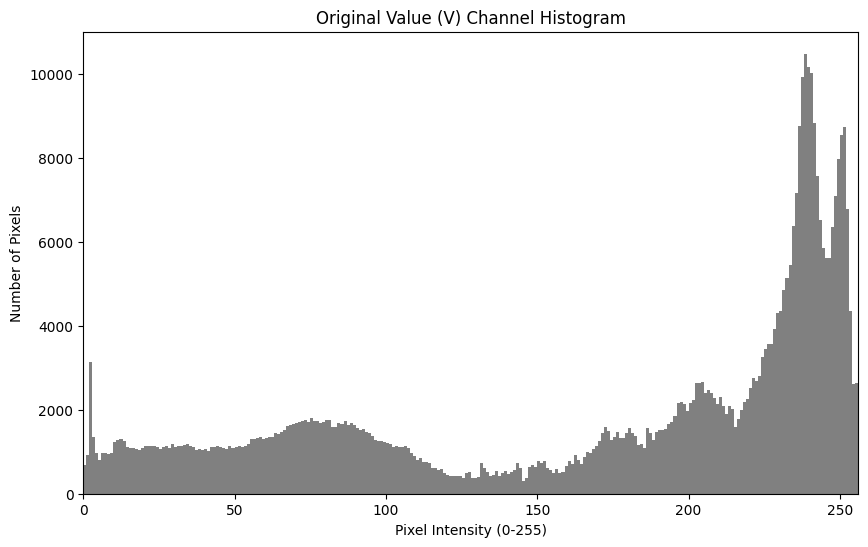

Original V-channel histogram saved to:
outputs/part1/original_v_histogram.png

Applying Histogram Equalization (on V-Channel)...


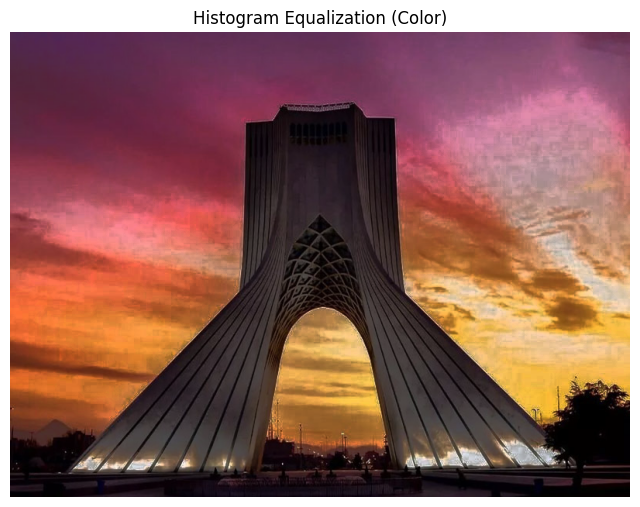

Image successfully saved to:
outputs/part1/histogram_equalized_color.jpg

Plotting and saving the equalized V-channel histogram...


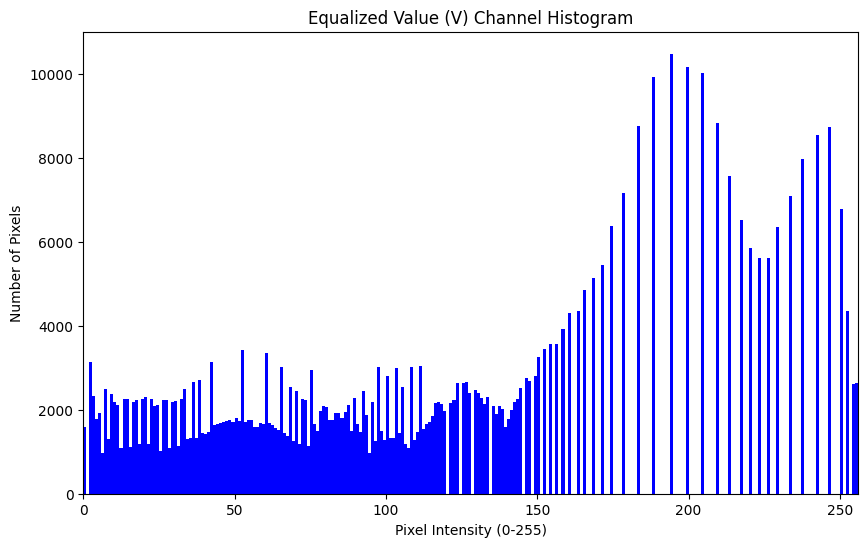

Equalized V-channel histogram saved to:
outputs/part1/equalized_v_histogram.png

Applying Histogram Stretching (on V-Channel)...


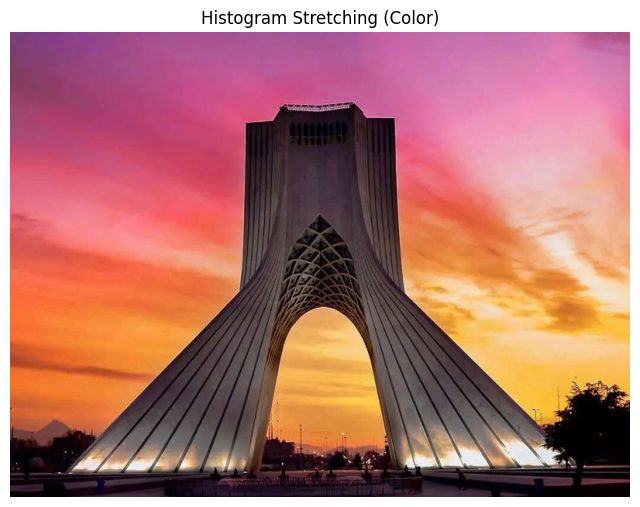

Image successfully saved to:
outputs/part1/histogram_stretched_color.jpg

Plotting and saving the stretched V-channel histogram...


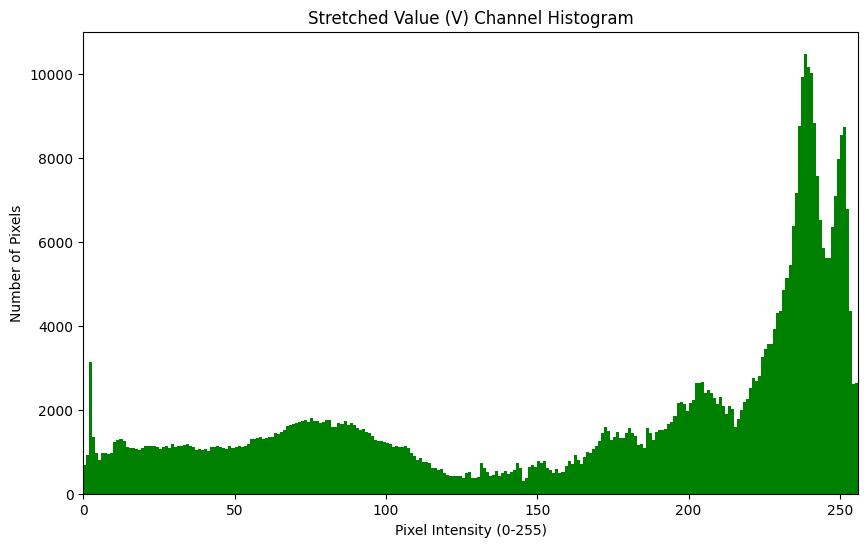

Stretched V-channel histogram saved to:
outputs/part1/stretched_v_histogram.png


--- All operations completed successfully! ---
All outputs have been saved to the 'outputs/part1' folder.


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# -------------------------------------------------------------------
# Section 1: Helper Functions
# -------------------------------------------------------------------

def show_img(title, img, cmap=None):
    """
    A helper function to display images using Matplotlib.
    It automatically converts BGR (OpenCV format) to RGB (Matplotlib format).
    """
    plt.figure(figsize=(8, 8))
    if cmap:
        # For Grayscale or Binary images
        plt.imshow(img, cmap=cmap)
    else:
        # For Color images
        if len(img.shape) == 3:
            # Convert BGR (OpenCV) to RGB (Matplotlib)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img_rgb)
        else:
            # Fallback for single-channel images if cmap wasn't specified
            plt.imshow(img, cmap='gray')

    plt.title(title)
    plt.axis('off') # Hide axes
    plt.show()

def save_img(output_dir, filename, img):
    """
    A helper function to save an image to the specified output directory.
    """
    path = os.path.join(output_dir, filename)
    try:
        cv2.imwrite(path, img)
        print(f"Image successfully saved to:\n{path}\n")
    except Exception as e:
        print(f"Error saving file {filename}: {e}")

# -------------------------------------------------------------------
# Section 2: Main Image Processing Pipeline
# -------------------------------------------------------------------

def main_image_processing():
    # --- Step 0: Define Paths (Relative Paths) ---
    print("--- Step 0: Setting up paths ---")

    input_dir = "assets"

    output_base = "outputs"
    output_dir = os.path.join(output_base, "part1")

    img_filename = "Pic.jpg"
    img_path = os.path.join(input_dir, img_filename)

    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    print(f"Input path: {img_path}")
    print(f"Output directory is ready: {output_dir}")

    # -------------------------------------------------
    # --- Step 1: Load Image and Print Information ---
    # -------------------------------------------------
    print("\n--- Step 1: Loading Image and Displaying Info ---")

    if not os.path.exists(img_path):
        print(f"Error: Image not found at {img_path}")
        print(f"Please make sure you created the '{input_dir}' folder and put '{img_filename}' inside it.")
        return

    img_bgr = cv2.imread(img_path)

    if img_bgr is None:
        print("Error: Failed to load image. Check file integrity.")
        return

    print(f"Image Dimensions (Height, Width, Channels): {img_bgr.shape}")
    print(f"Data Type: {img_bgr.dtype}")
    print(f"Number of Color Channels: {img_bgr.shape[2]}")

    # Show the original image
    show_img("Original Image (BGR loaded, shown as RGB)", img_bgr)

    # -------------------------------------------------
    # --- Step 2: Convert, Show, and Save Color Spaces ---
    # -------------------------------------------------
    print("\n--- Step 2: Converting Color Spaces ---")

    # RGB (Original)
    print("Showing and saving RGB (Original) image...")
    show_img("RGB (Original)", img_bgr)
    save_img(output_dir, "rgb_image.jpg", img_bgr)

    # Grayscale
    print("Converting to Grayscale...")
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    show_img("Grayscale", img_gray, cmap='gray')
    save_img(output_dir, "grayscale_image.jpg", img_gray)

    # Binary
    print("Converting to Binary (Otsu's Thresholding)...")
    ret, img_binary = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    print(f"Calculated Binary Threshold (Otsu): {ret}")
    show_img("Binary", img_binary, cmap='gray')
    save_img(output_dir, "binary_image.jpg", img_binary)

    # HSV
    print("Converting to HSV...")
    img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    print("Showing HSV image...")
    show_img("HSV Color Space (Direct Display)", img_hsv)
    save_img(output_dir, "hsv_image.jpg", img_hsv)

    # -------------------------------------------------
    # --- Step 3: Split BGR and HSV Components ---
    # -------------------------------------------------
    print("\n--- Step 3: Splitting Color Channels ---")

    # Split BGR and show as grayscale maps
    print("Splitting BGR channels (shown as grayscale intensity maps)...")
    b_channel, g_channel, r_channel = cv2.split(img_bgr)

    show_img("Blue Channel (Grayscale)", b_channel, cmap='gray')
    show_img("Green Channel (Grayscale)", g_channel, cmap='gray')
    show_img("Red Channel (Grayscale)", r_channel, cmap='gray')

    # Split HSV
    print("Splitting HSV components (shown as grayscale)...")
    h_channel, s_channel, v_channel = cv2.split(img_hsv)
    show_img("Hue Channel (H)", h_channel, cmap='gray')
    show_img("Saturation Channel (S)", s_channel, cmap='gray')
    show_img("Value Channel (V)", v_channel, cmap='gray')

    # -------------------------------------------------
    # --- Step 4: Manipulate Contrast (on Color Image) ---
    # -------------------------------------------------
    print("\n--- Step 4: Contrast Manipulation (on BGR Image) ---")

    # Calculate original contrast from grayscale version for reference
    original_contrast = np.std(img_gray)
    print(f"Original Contrast (Std. Deviation of Grayscale): {original_contrast:.2f}")

    # Increase Contrast (High Contrast)
    alpha_high = 2.0
    img_high_contrast = cv2.convertScaleAbs(img_bgr, alpha=alpha_high, beta=0)
    print("Showing and saving High Contrast image...")
    show_img("High Contrast (Color)", img_high_contrast)
    save_img(output_dir, "high_contrast_color.jpg", img_high_contrast)

    # Decrease Contrast (Low Contrast)
    alpha_low = 0.5
    img_low_contrast = cv2.convertScaleAbs(img_bgr, alpha=alpha_low, beta=0)
    print("Showing and saving Low Contrast image...")
    show_img("Low Contrast (Color)", img_low_contrast)
    save_img(output_dir, "low_contrast_color.jpg", img_low_contrast)

    # -------------------------------------------------
    # --- Step 5: Apply Histogram Techniques (on Color Image) ---
    # -------------------------------------------------
    print("\n--- Step 5: Histogram Correction (on Color Image via V-Channel) ---")

    # Plot and save the original V-channel histogram
    print("Plotting and saving the original V-channel histogram...")
    # Split the channels from the HSV image created in Step 2
    h, s, v = cv2.split(img_hsv)

    plt.figure(figsize=(10, 6))
    plt.hist(v.ravel(), bins=256, range=[0, 256], color='gray')
    plt.title('Original Value (V) Channel Histogram')
    plt.xlabel('Pixel Intensity (0-255)')
    plt.ylabel('Number of Pixels')
    plt.xlim([0, 256])

    hist_path = os.path.join(output_dir, "original_v_histogram.png")
    plt.savefig(hist_path)
    plt.show()
    print(f"Original V-channel histogram saved to:\n{hist_path}\n")


    # 1. Histogram Equalization (on V Channel)
    print("Applying Histogram Equalization (on V-Channel)...")
    v_eq = cv2.equalizeHist(v)
    hsv_eq = cv2.merge([h, s, v_eq])
    img_hist_eq_color = cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2BGR)

    show_img("Histogram Equalization (Color)", img_hist_eq_color)
    save_img(output_dir, "histogram_equalized_color.jpg", img_hist_eq_color)

    # --- Plot and save the EQUALIZED V-channel histogram ---
    print("Plotting and saving the equalized V-channel histogram...")
    plt.figure(figsize=(10, 6))
    plt.hist(v_eq.ravel(), bins=256, range=[0, 256], color='blue')
    plt.title('Equalized Value (V) Channel Histogram')
    plt.xlabel('Pixel Intensity (0-255)')
    plt.ylabel('Number of Pixels')
    plt.xlim([0, 256])

    hist_eq_path = os.path.join(output_dir, "equalized_v_histogram.png")
    plt.savefig(hist_eq_path)
    plt.show()
    print(f"Equalized V-channel histogram saved to:\n{hist_eq_path}\n")

    # 2. Histogram Stretching (on V Channel)
    print("Applying Histogram Stretching (on V-Channel)...")
    v_stretch = cv2.normalize(v, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    hsv_stretch = cv2.merge([h, s, v_stretch])
    img_hist_stretch_color = cv2.cvtColor(hsv_stretch, cv2.COLOR_HSV2BGR)

    show_img("Histogram Stretching (Color)", img_hist_stretch_color)
    save_img(output_dir, "histogram_stretched_color.jpg", img_hist_stretch_color)

    # --- Plot and save the STRETCHED V-channel histogram ---
    print("Plotting and saving the stretched V-channel histogram...")
    plt.figure(figsize=(10, 6))
    plt.hist(v_stretch.ravel(), bins=256, range=[0, 256], color='green')
    plt.title('Stretched Value (V) Channel Histogram')
    plt.xlabel('Pixel Intensity (0-255)')
    plt.ylabel('Number of Pixels')
    plt.xlim([0, 256])

    hist_stretch_path = os.path.join(output_dir, "stretched_v_histogram.png")
    plt.savefig(hist_stretch_path)
    plt.show()
    print(f"Stretched V-channel histogram saved to:\n{hist_stretch_path}\n")

    print("\n--- All operations completed successfully! ---")
    print(f"All outputs have been saved to the '{output_dir}' folder.")

# -------------------------------------------------------------------
# Run the main function
# -------------------------------------------------------------------
main_image_processing()

# Part 2: Noise, Filtering, and Edge Detection

## 1. Simulating Image Noise

To test our filters, we first add artificial noise:

* **Salt & Pepper Noise:** This noise simulates sensor errors where a pixel's data is lost. We add it by selecting a small percentage of random pixels and changing their value to either **pure black (0)** (the "pepper") or **pure white (255)** (the "salt").
* **Gaussian Noise:** This noise simulates the random "static" or "grain" from a camera sensor (e.g., from heat or low light). We add it by generating a random value from a Gaussian (bell curve) distribution and adding it to *every pixel* in the image.

## 2. Kernels and Convolution

A **Kernel** is a small matrix (a grid of numbers, like 3x3 or 5x5) that acts like a "lens" or "filter". It's the core component of most linear image filters.

**How it's applied (Convolution):**
The process of applying a kernel is called **convolution**.
1.  We "slide" this small kernel over every single pixel in our main image.
2.  At each position, we place the kernel on top of the pixels.
3.  We multiply the kernel's numbers by the image pixel values they are covering.
4.  We sum up all these multiplied results.
5.  This final sum becomes the **new value** for the center pixel.

By designing different numbers in the kernel, we can achieve different effects, such as blurring, sharpening, and edge detection.

## 3. Smoothing Filters (Mean, Gaussian, Median)

We use smoothing filters to blur an image, which is very effective for removing noise.

* **Mean Filter:** This is the simplest blur. Its kernel is filled with equal values (e.g., a 3x3 kernel where every number is 1/9). It slides over the image and replaces each pixel with the simple **average** of its neighbors.
* **Gaussian Filter:** This is a "smarter" average. Its kernel has higher values in the center and lower values at the edges. This means it calculates a **weighted average**, giving more importance to the center pixel. This creates a much smoother, more natural-looking blur.
* **Median Filter:** This is a **non-linear** filter and does *not* use a kernel for convolution. Instead, it "sorts" all the neighboring pixels by their brightness (from darkest to brightest) and replaces the center pixel with the **middle (median)** value.

### Which filter is best for Salt & Pepper noise?

The **Median Filter** is far superior for removing Salt & Pepper noise.

**Why?** Imagine a 3x3 window with a single white (255) noise pixel.
* A **Mean** filter would *average* this 255 with the 8 other normal pixels. This would just create a gray "smudge" and not remove the noise.
* A **Median** filter *sorts* the 9 pixels. The noise pixel (255) will be at the very end of the sorted list. The filter picks the *middle* value (the 5th pixel), which will be one of the "good" normal pixels. It effectively throws the outlier noise away.

## 4. Edge Detection Filters

Edge detection filters find areas in the image with high contrast (rapid changes in brightness).

* **Sobel Filter:** This uses *two* separate kernels (Gx and Gy) to find changes in brightness in the horizontal (X) and vertical (Y) directions. It measures the "gradient" (slope) of the brightness. We apply both kernels and combine the results to get a clean edge map.
* **Laplacian Filter:** This uses a *single* kernel (e.g., `[[0, 1, 0], [1, -4, 1], [0, 1, 0]]`) that finds the "second derivative" of the image. This makes it very sensitive to fine lines and edges in all directions, but it is also very sensitive to noise.
* **Canny Edge Detector:** This is the most popular method. It's not a single filter but a multi-step **algorithm**:
    1.  Applies a **Gaussian** blur to remove noise.
    2.  Uses **Sobel** filters to find the direction and strength of edges.
    3.  Thins the edges (Non-Maximum Suppression) to get sharp 1-pixel lines.
    4.  Uses two thresholds (Hysteresis) to connect strong edges and remove weak, isolated ones.

--- Step 0: Setting up paths ---
Output directory is ready: outputs/part2
Original image loaded.

--- Step 1: Adding Noise ---
Adding Salt & Pepper noise...


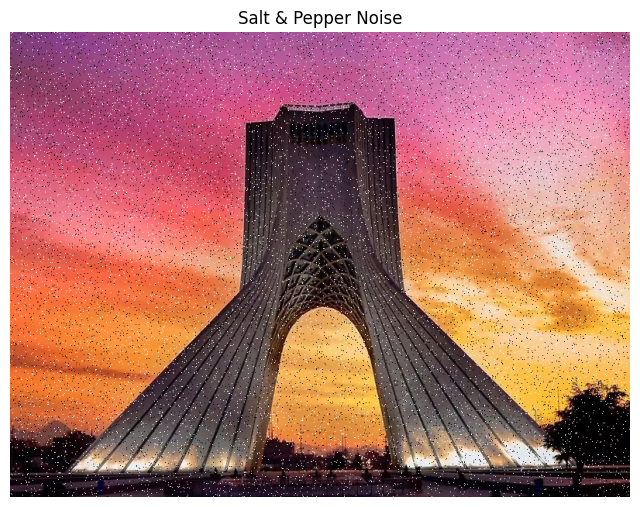

Image successfully saved to:
outputs/part2/noise_salt_pepper.jpg

Adding Gaussian noise...


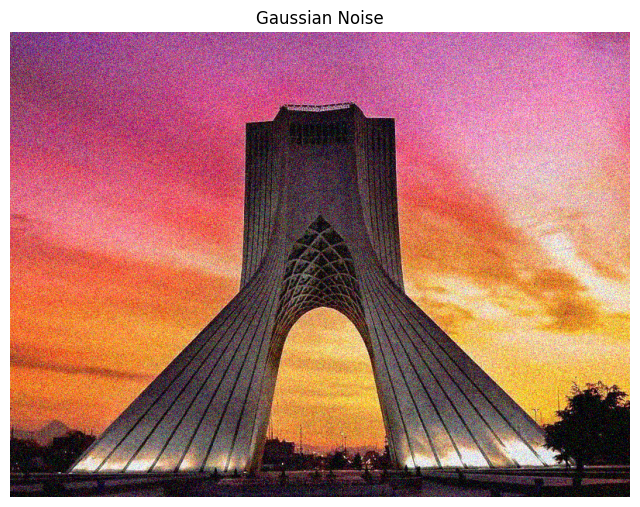

Image successfully saved to:
outputs/part2/noise_gaussian.jpg


--- Step 2: Applying Filters to Original Image ---
We will define manual 'matrices' (kernels) for linear filters.
Applying manual 3x3 Mean filter...


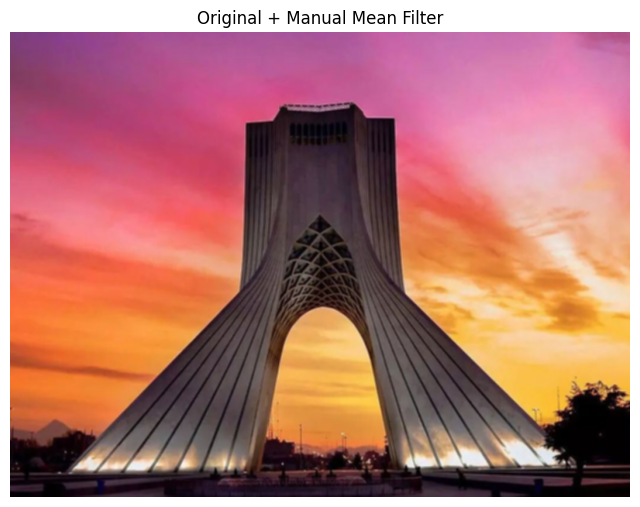

Image successfully saved to:
outputs/part2/original_filter_mean.jpg

Applying manual 3x3 Gaussian filter...


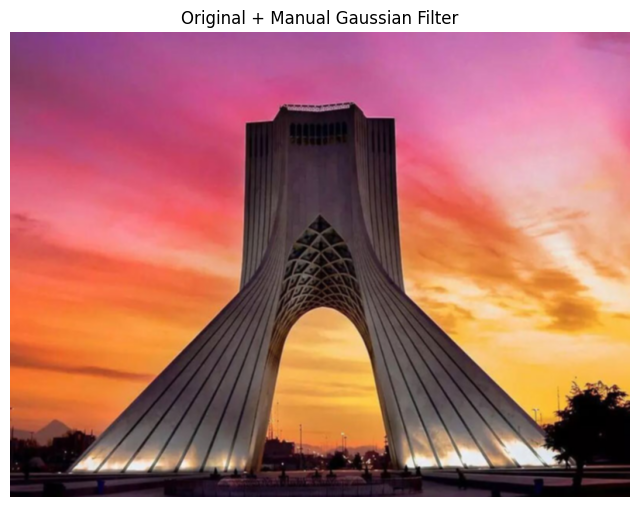

Image successfully saved to:
outputs/part2/original_filter_gaussian.jpg

Applying 3x3 Median filter...
NOTE: Median filter is non-linear and doesn't use a 'matrix' (kernel).
We use the optimized cv2.medianBlur() function instead.


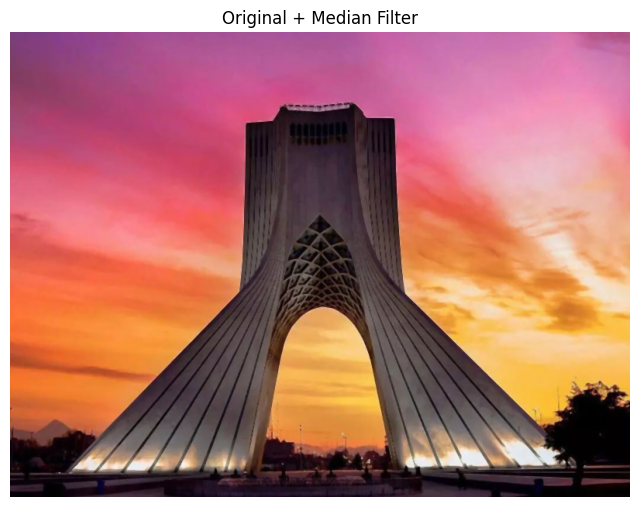

Image successfully saved to:
outputs/part2/original_filter_median.jpg


--- Step 3: Applying Filters to Denoise S&P Image ---
We use the same filters on the 'noise_salt_pepper.jpg' image.
Applying manual Mean filter to S&P...


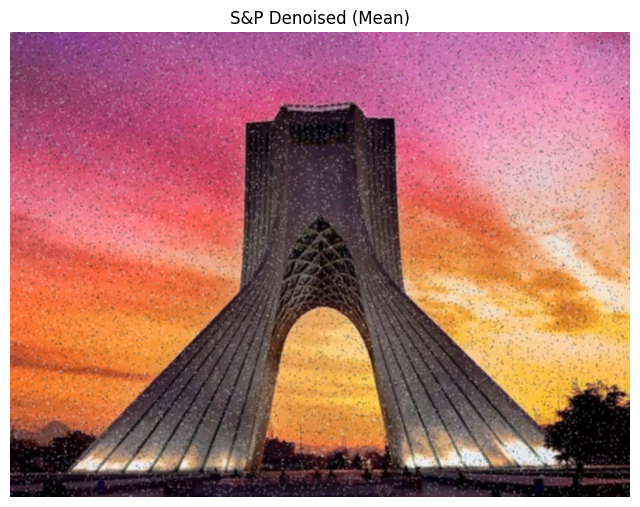

Image successfully saved to:
outputs/part2/denoised_sp_mean.jpg

Applying manual Gaussian filter to S&P...


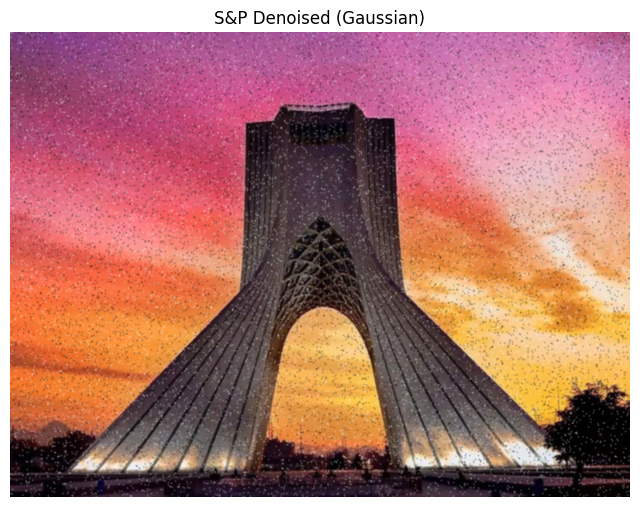

Image successfully saved to:
outputs/part2/denoised_sp_gaussian.jpg

Applying Median filter to S&P...


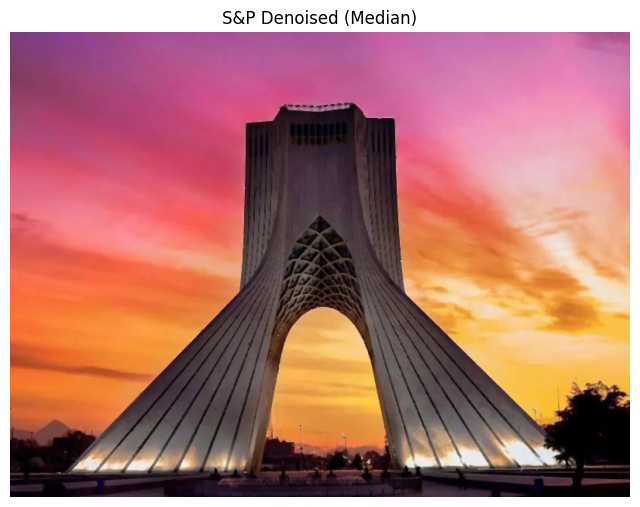

Image successfully saved to:
outputs/part2/denoised_sp_median.jpg

--> Notice how the Median filter is MUCH better at removing S&P noise!

--- Step 4: Applying Edge Detection Filters (on Grayscale) ---
Applying manual Sobel filter...


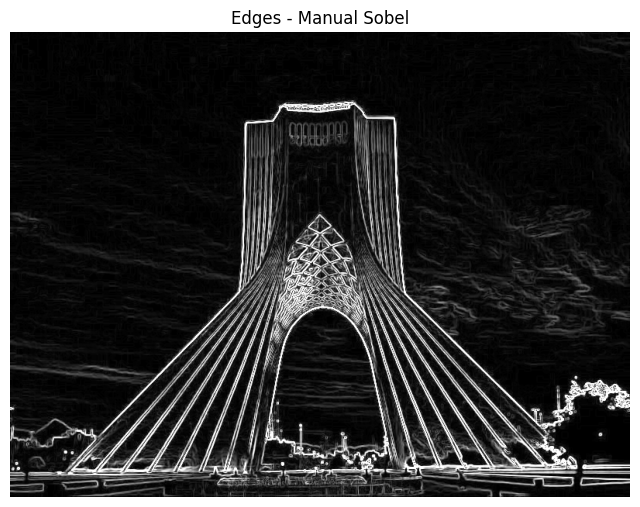

Image successfully saved to:
outputs/part2/edges_manual_sobel.jpg

Applying manual Laplacian filter...


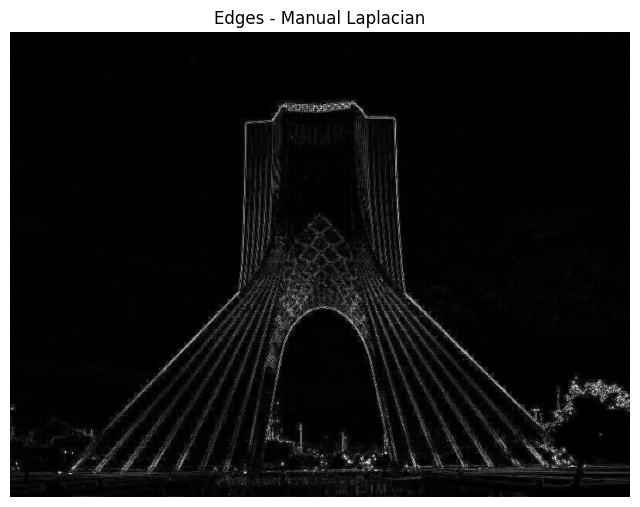

Image successfully saved to:
outputs/part2/edges_manual_laplacian.jpg

Applying Canny edge detector...
NOTE: Canny is a multi-stage *algorithm*, not a single 'matrix'.
We use the optimized cv2.Canny() function.


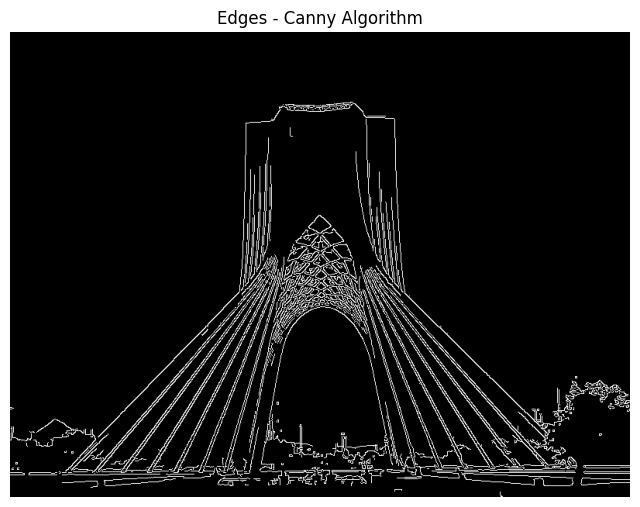

Image successfully saved to:
outputs/part2/edges_canny.jpg


--- Part 2 operations completed successfully! ---
All outputs have been saved to the outputs/part2 folder.


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# -------------------------------------------------------------------
# Section 1: Helper Functions
# -------------------------------------------------------------------

def show_img(title, img, cmap=None):
    """
    A helper function to display images using Matplotlib.
    It automatically converts BGR (OpenCV format) to RGB (Matplotlib format).
    """
    plt.figure(figsize=(8, 8))
    if cmap:
        plt.imshow(img, cmap=cmap)
    else:
        if len(img.shape) == 3:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img_rgb)
        else:
            plt.imshow(img, cmap='gray')

    plt.title(title)
    plt.axis('off')
    plt.show()

def save_img(output_dir, filename, img):
    """
    A helper function to save an image to the specified output directory.
    """
    path = os.path.join(output_dir, filename)
    try:
        cv2.imwrite(path, img)
        print(f"Image successfully saved to:\n{path}\n")
    except Exception as e:
        print(f"Error saving file {filename}: {e}")

# -------------------------------------------------------------------
# Section 2: Noise Generators
# -------------------------------------------------------------------

def add_salt_and_pepper_noise(img, prob=0.05):
    """
    Adds Salt & Pepper noise to a copy of an image.
    prob: Probability of a pixel being turned to 0 (pepper) or 255 (salt).
    """
    output = np.copy(img)

    # Check if image is grayscale or color to handle channels correctly
    if len(img.shape) == 2: # Grayscale
        rows, cols = img.shape
        # Add Salt
        num_salt = int(np.ceil(prob * img.size * 0.5))
        coords = [np.random.randint(0, i - 1, num_salt) for i in img.shape]
        output[coords[0], coords[1]] = 255

        # Add Pepper
        num_pepper = int(np.ceil(prob * img.size * 0.5))
        coords = [np.random.randint(0, i - 1, num_pepper) for i in img.shape]
        output[coords[0], coords[1]] = 0

    else: # Color
        rows, cols, ch = img.shape
        num_salt = int(prob * img.shape[0] * img.shape[1] * 0.5)
        num_pepper = int(prob * img.shape[0] * img.shape[1] * 0.5)

        # Add Salt (white pixels)
        for _ in range(num_salt):
            h = random.randint(0, rows - 1)
            w = random.randint(0, cols - 1)
            output[h, w] = (255, 255, 255)

        # Add Pepper (black pixels)
        for _ in range(num_pepper):
            h = random.randint(0, rows - 1)
            w = random.randint(0, cols - 1)
            output[h, w] = (0, 0, 0)

    return output

def add_gaussian_noise(img, mean=0, sigma=25):
    """
    Adds Gaussian noise to a copy of an image.
    """
    noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)
    output = cv2.add(img.astype(np.float32), noise)

    # Clip values to be in the valid [0, 255] range
    output = np.clip(output, 0, 255)

    return output.astype(np.uint8)

# -------------------------------------------------------------------
# Section 3: Main Image Processing Pipeline (Part 2)
# -------------------------------------------------------------------

def main_image_processing_part2():
    # --- Step 0: Define Paths (Relative) ---
    print("--- Step 0: Setting up paths ---")

    input_dir = "assets"
    img_path = os.path.join(input_dir, "Pic.jpg")

    output_base = "outputs"
    output_dir = os.path.join(output_base, "part2")

    os.makedirs(output_dir, exist_ok=True)
    print(f"Output directory is ready: {output_dir}")

    # Load original image
    if not os.path.exists(img_path):
        print(f"Error: Image not found at {img_path}")
        return

    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        print(f"Error: Image not loaded from {img_path}.")
        return

    # Also get a grayscale version for edge detection later
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    print("Original image loaded.")

    # -------------------------------------------------
    # --- Step 1: Add and Save Noise ---
    # -------------------------------------------------
    print("\n--- Step 1: Adding Noise ---")

    # 1. Salt & Pepper Noise
    print("Adding Salt & Pepper noise...")
    img_sp = add_salt_and_pepper_noise(img_bgr, prob=0.05)
    show_img("Salt & Pepper Noise", img_sp)
    save_img(output_dir, "noise_salt_pepper.jpg", img_sp)

    # 2. Gaussian Noise (another famous noise)
    print("Adding Gaussian noise...")
    img_gauss = add_gaussian_noise(img_bgr, mean=0, sigma=30)
    show_img("Gaussian Noise", img_gauss)
    save_img(output_dir, "noise_gaussian.jpg", img_gauss)

    # -------------------------------------------------
    # --- Step 2: Apply Filters to ORIGINAL Image ---
    # -------------------------------------------------
    print("\n--- Step 2: Applying Filters to Original Image ---")
    print("We will define manual 'matrices' (kernels) for linear filters.")

    # 1. Manual Mean Filter (using its matrix/kernel)
    print("Applying manual 3x3 Mean filter...")
    # The matrix is 3x3, and all values are 1/9
    ksize = 3
    mean_kernel = (1.0 / (ksize*ksize)) * np.ones((ksize, ksize), dtype=np.float32)
    # cv2.filter2D applies this manual kernel
    mean_orig = cv2.filter2D(img_bgr, -1, mean_kernel)
    show_img("Original + Manual Mean Filter", mean_orig)
    save_img(output_dir, "original_filter_mean.jpg", mean_orig)

    # 2. Manual Gaussian Filter (using its matrix/kernel)
    print("Applying manual 3x3 Gaussian filter...")
    # This is a standard 3x3 Gaussian kernel matrix (sigma=1)
    gaussian_kernel = (1.0 / 16.0) * np.array(
        [[1, 2, 1],
         [2, 4, 2],
         [1, 2, 1]], dtype=np.float32)
    gauss_orig = cv2.filter2D(img_bgr, -1, gaussian_kernel)
    show_img("Original + Manual Gaussian Filter", gauss_orig)
    save_img(output_dir, "original_filter_gaussian.jpg", gauss_orig)

    # 3. Median Filter (Non-Linear)
    print("Applying 3x3 Median filter...")
    print("NOTE: Median filter is non-linear and doesn't use a 'matrix' (kernel).")
    print("We use the optimized cv2.medianBlur() function instead.")
    median_orig = cv2.medianBlur(img_bgr, 3) # 3 is the ksize
    show_img("Original + Median Filter", median_orig)
    save_img(output_dir, "original_filter_median.jpg", median_orig)

    # -------------------------------------------------
    # --- Step 3: Denoise Salt & Pepper Image ---
    # -------------------------------------------------
    print("\n--- Step 3: Applying Filters to Denoise S&P Image ---")
    print("We use the same filters on the 'noise_salt_pepper.jpg' image.")

    # 1. Mean Filter on S&P
    print("Applying manual Mean filter to S&P...")
    mean_denoised = cv2.filter2D(img_sp, -1, mean_kernel)
    show_img("S&P Denoised (Mean)", mean_denoised)
    save_img(output_dir, "denoised_sp_mean.jpg", mean_denoised)

    # 2. Gaussian Filter on S&P
    print("Applying manual Gaussian filter to S&P...")
    gauss_denoised = cv2.filter2D(img_sp, -1, gaussian_kernel)
    show_img("S&P Denoised (Gaussian)", gauss_denoised)
    save_img(output_dir, "denoised_sp_gaussian.jpg", gauss_denoised)

    # 3. Median Filter on S&P
    print("Applying Median filter to S&P...")
    median_denoised = cv2.medianBlur(img_sp, 3)
    show_img("S&P Denoised (Median)", median_denoised)
    save_img(output_dir, "denoised_sp_median.jpg", median_denoised)
    print("--> Notice how the Median filter is MUCH better at removing S&P noise!")

    # -------------------------------------------------
    # --- Step 4: Edge Detection Filters ---
    # -------------------------------------------------
    print("\n--- Step 4: Applying Edge Detection Filters (on Grayscale) ---")

    # 1. Manual Sobel Filter (using its matrices)
    print("Applying manual Sobel filter...")
    # Sobel uses two kernels: one for vertical edges (Gx) and one for horizontal (Gy)
    sobel_x_kernel = np.array(
        [[-1, 0, 1],
         [-2, 0, 2],
         [-1, 0, 1]], dtype=np.float32)
    sobel_y_kernel = np.array(
        [[-1, -2, -1],
         [ 0,  0,  0],
         [ 1,  2,  1]], dtype=np.float32)

    # Apply kernels separately
    # cv2.CV_64F allows for negative numbers in the gradient
    g_x = cv2.filter2D(img_gray, cv2.CV_64F, sobel_x_kernel)
    g_y = cv2.filter2D(img_gray, cv2.CV_64F, sobel_y_kernel)

    # Combine the gradients
    # sobel_edges = np.sqrt(g_x**2 + g_y**2)
    sobel_edges = cv2.magnitude(g_x, g_y)

    # Convert back to uint8 (0-255) for display
    sobel_edges = cv2.convertScaleAbs(sobel_edges)
    show_img("Edges - Manual Sobel", sobel_edges, cmap='gray')
    save_img(output_dir, "edges_manual_sobel.jpg", sobel_edges)

    # 2. Manual Laplacian Filter (using its matrix)
    print("Applying manual Laplacian filter...")
    # A common 3x3 Laplacian kernel
    laplacian_kernel = np.array(
        [[0,  1, 0],
         [1, -4, 1],
         [0,  1, 0]], dtype=np.float32)

    laplacian_edges = cv2.filter2D(img_gray, cv2.CV_64F, laplacian_kernel)
    laplacian_edges = cv2.convertScaleAbs(laplacian_edges)
    show_img("Edges - Manual Laplacian", laplacian_edges, cmap='gray')
    save_img(output_dir, "edges_manual_laplacian.jpg", laplacian_edges)

    # 3. Canny Edge Detector (Algorithm)
    print("Applying Canny edge detector...")
    print("NOTE: Canny is a multi-stage *algorithm*, not a single 'matrix'.")
    print("We use the optimized cv2.Canny() function.")
    # The numbers 100 and 200 are the min and max thresholds
    canny_edges = cv2.Canny(img_gray, 100, 200)
    show_img("Edges - Canny Algorithm", canny_edges, cmap='gray')
    save_img(output_dir, "edges_canny.jpg", canny_edges)


    print("\n--- Part 2 operations completed successfully! ---")
    print(f"All outputs have been saved to the {output_dir} folder.")

# -------------------------------------------------------------------
# Run the main function
# -------------------------------------------------------------------
main_image_processing_part2()

# Part 3: Video Processing - Applying Noise to Frames

In [4]:
import cv2
import numpy as np
import os
import random

# -------------------------------------------------------------------
# Section 1: Helper Functions
# -------------------------------------------------------------------

def add_salt_and_pepper_noise(img, prob=0.05):
    """
    Adds Salt & Pepper noise to a copy of an image/frame.
    """
    output = np.copy(img)

    # Check if image is grayscale or color
    if len(img.shape) == 2:
        # Grayscale
        num_salt = int(img.size * prob * 0.5)
        num_pepper = int(img.size * prob * 0.5)

        # Add Salt
        coords_salt = [np.random.randint(0, i - 1, num_salt) for i in img.shape]
        output[tuple(coords_salt)] = 255

        # Add Pepper
        coords_pepper = [np.random.randint(0, i - 1, num_pepper) for i in img.shape]
        output[tuple(coords_pepper)] = 0

    else:
        # Color
        # Note: Iterating pixel by pixel is slow for video, but we keep it
        # to match the logic used in previous steps.
        num_salt = int(img.shape[0] * img.shape[1] * prob * 0.5)
        num_pepper = int(img.shape[0] * img.shape[1] * prob * 0.5)

        # Add Salt (white pixels)
        for _ in range(num_salt):
            h = random.randint(0, img.shape[0] - 1)
            w = random.randint(0, img.shape[1] - 1)
            output[h, w] = (255, 255, 255)

        # Add Pepper (black pixels)
        for _ in range(num_pepper):
            h = random.randint(0, img.shape[0] - 1)
            w = random.randint(0, img.shape[1] - 1)
            output[h, w] = (0, 0, 0)

    return output

# -------------------------------------------------------------------
# Section 2: Main Video Processing Pipeline (Part 3)
# -------------------------------------------------------------------

def main_video_processing_part3():
    # --- Step 0: Define Paths (Relative) ---
    print("--- Step 0: Setting up paths ---")

    input_dir = "assets"
    video_filename = "Original_Vid.mp4"
    video_in_path = os.path.join(input_dir, video_filename)

    output_base = "outputs"
    output_dir = os.path.join(output_base, "part3")

    os.makedirs(output_dir, exist_ok=True)
    print(f"Output directory is ready: {output_dir}")

    # Define the output video path
    video_out_path = os.path.join(output_dir, "noisy_video.mp4")

    # -------------------------------------------------
    # --- Step 1: Load Video and Get Properties ---
    # -------------------------------------------------
    print("\n--- Step 1: Loading Video and Getting Properties ---")

    # Check input existence
    if not os.path.exists(video_in_path):
        print(f"Error: Video file not found at {video_in_path}")
        print(f"Please copy '{video_filename}' into the '{input_dir}' folder.")
        return

    cap = cv2.VideoCapture(video_in_path)

    # Check if video opened successfully
    if not cap.isOpened():
        print(f"Error: Could not open video file.")
        return

    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    print(f"Video Loaded Successfully:")
    print(f"  - FPS: {fps}")
    print(f"  - Total Frames: {frame_count}")
    print(f"  - Dimensions: {frame_width} x {frame_height}")

    # -------------------------------------------------
    # --- Step 2: Process Video and Add Noise ---
    # -------------------------------------------------
    print("\n--- Step 2: Adding Salt & Pepper Noise to Video ---")

    # Define the codec and create VideoWriter object
    # 'mp4v' is a standard codec for .mp4. If it fails on Windows, try 'avc1' or 'XVID'
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(video_out_path, fourcc, fps, (frame_width, frame_height))

    print(f"Processing video... This may take a while for {frame_count} frames.")

    processed_frames = 0
    while True:
        # Read frame by frame
        ret, frame = cap.read()

        # if 'ret' is False, it means we reached the end of the video
        if not ret:
            break

        # Apply the Salt & Pepper noise function
        # Note: Since this function uses a loop for color images, it might be slow.
        noisy_frame = add_salt_and_pepper_noise(frame, prob=0.05)

        # Write the noisy frame to the new video file
        out.write(noisy_frame)

        processed_frames += 1

        # Optional: Print progress every 50 frames
        if processed_frames % 50 == 0:
            print(f"  ... processed {processed_frames} / {frame_count} frames ...")

    # -------------------------------------------------
    # --- Step 3: Release Resources ---
    # -------------------------------------------------
    print("\n--- Step 3: Finishing Up ---")

    # Release the video capture and writer objects
    cap.release()
    out.release()

    print("Video processing complete.")
    print(f"Noisy video successfully saved to:\n{video_out_path}")

# -------------------------------------------------------------------
# Run the main function
# -------------------------------------------------------------------
main_video_processing_part3()

--- Step 0: Setting up paths ---
Output directory is ready: outputs/part3

--- Step 1: Loading Video and Getting Properties ---
Video Loaded Successfully:
  - FPS: 30.0
  - Total Frames: 545
  - Dimensions: 640 x 360

--- Step 2: Adding Salt & Pepper Noise to Video ---
Processing video... This may take a while for 545 frames.
  ... processed 50 / 545 frames ...
  ... processed 100 / 545 frames ...
  ... processed 150 / 545 frames ...
  ... processed 200 / 545 frames ...
  ... processed 250 / 545 frames ...
  ... processed 300 / 545 frames ...
  ... processed 350 / 545 frames ...
  ... processed 400 / 545 frames ...
  ... processed 450 / 545 frames ...
  ... processed 500 / 545 frames ...

--- Step 3: Finishing Up ---
Video processing complete.
Noisy video successfully saved to:
outputs/part3/noisy_video.mp4
